# Import neccessary Packages

In [1]:
import networkx as nx
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn import preprocessing
from varname import nameof
import metis
import math
import random
import plotly.figure_factory as ff
import plotly
from scipy.stats import gaussian_kde
import operator
random.seed(1)

# Read Adjacency Matrix from file to pandas Dataframe

In [42]:
df = pd.read_csv("./adjazenz_matrix.csv", delimiter=";", header=0, index_col=0)

# Convert Index and Transform Dataframe to numpy Array

In [43]:
df.index += 1 

In [44]:
adj = df.to_numpy()

# Create directed Graph from numpy array

In [5]:
g=nx.from_numpy_matrix(adj, create_using=nx.DiGraph())

# Transform directed Graph to undirected Graph

In [6]:
G = nx.Graph()
G.add_edges_from(g.edges, weight=0)

In [7]:
for u, v, d in g.edges(data=True):
    G[u][v]['weight'] += d['weight']

# Create circular graph Layout

In [8]:
pos=nx.circular_layout(g)

In [9]:
for node in G.nodes:
    G.nodes[node]['pos'] = list(pos[node])

# Cut graph in N nearly equally sized subgraphs while maximizing average edge weigth per subgraph

In [10]:
G.graph['edge_weight_attr'] = 'weight'
G_metis = metis.networkx_to_metis(G)

In [11]:
N = 3
(edgecuts, parts) = metis.part_graph(G_metis, N, recursive=True)

# Create graphs representing the actual groups

In [12]:
IST_1 = G.subgraph(list(range(0,9)))
IST_2 = G.subgraph(list(range(9,18)))
IST_3 = G.subgraph(list(range(18,28)))

# Create graphs representing suggested groups

In [16]:
SOLL_1 = G.subgraph([i for i, j in enumerate(parts) if j==0])
SOLL_2 = G.subgraph([i for i, j in enumerate(parts) if j==1])
SOLL_3 = G.subgraph([i for i, j in enumerate(parts) if j==2])

# Plot all graphs

In [17]:
all_graphs= [(G, "Whole Graph"), (IST_1, "Group 1 actual"), (IST_2, "Group 2 actual"), (IST_3, "Group 3 actual"), (SOLL_1, "Group 1 suggested"), (SOLL_2, "Group 2 suggested"), (SOLL_3, "Group 3 suggested")]

In [18]:
def plotly_graph(G, title):
    
    def make_edge(x, y, width):
        return  go.Scatter(
                    x=x,
                    y=y,
                    line=dict(width=width,color='#888'),
                    hoverinfo='none',
                    mode='lines')
    
    def make_node(x, y, node):
        node_weight = 0
        for edge in G.edges(node):
            node_weight += G.get_edge_data(*edge)["weight"]
            
        return go.Scatter(
            x=x, y=y,
            mode='markers+text',
            hoverinfo='text',
            text=['<b>' + str(node) + '</b>'],
            textfont=dict(
                family="Courier New",
                size=16,
                color="#333333",
                ),
            marker=dict(
                showscale=False,
                # colorscale options
                #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
                #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
                #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
                colorscale='Portland',
                cauto = False,
                cmin = min(node_weights)-10,
                cmax = max(node_weights)+10,
                reversescale=True,
                color=[],
                size= 30, #((node_weight - min(node_weights)) * (50 - 25)) / (max(node_weights) - min(node_weights))) + 25, # (node_weight)/1.5,
                line_width=2))

    pos=nx.circular_layout(G)
    
    for node in G.nodes:
        G.nodes[node]['pos'] = list(pos[node])
    
    node_text = []
    node_weights = []
    for node in G.nodes:
        node_weight = 0
        for edge in G.edges(node):
            node_weight += G.get_edge_data(*edge)["weight"]
        node_weights.append(node_weight)
        node_text.append('Sum of Edge weights: '+str(node_weight))
    
    edges = []
    nodes = []
    for edge in G.edges(data=True):
        x0, y0 = G.nodes[edge[0]]['pos']
        x1, y1 = G.nodes[edge[1]]['pos']
        width= (edge[2]["weight"]**2/100)+1 #((edge[2]["weight"]/5)) #**3/1000
        edges.append(make_edge((x0,x1), (y0,y1), width))
       
    for node in G.nodes():
        x, y = G.nodes[node]['pos']
        nodes.append(make_node([x], [y], node))
    
    for counter, node in enumerate(nodes):
        node.marker.color = [node_weights[counter]]
        node.hovertext = node_text[counter]
        
    for node in nodes:
        edges.append(node)
    minx = 1
    maxx = 2
    miny = 1
    maxy = 2
    
    dummy_trace=go.Scatter(x=[0, 0],
             y=[0, 0],
             mode='markers',
             marker=dict(
                 size=0, 
                 color="rgba(255,255,255,0)", 
                 colorscale="Portland", 
                 showscale=True,
                cauto = False,
                cmin = min(node_weights)-10,
                cmax = max(node_weights)+10,
                 reversescale=True,
                 colorbar=dict(
                thickness=15,
                title='Summe der Kantengewichte',
                xanchor='left',
                titleside='right'
                ),
                 
             ),
             hoverinfo='none'
            )
    
    node_weights.append(0)   
    node_text.append('Sum of Edge weights: '+str(0))
    edges.append(dummy_trace)
    
    fig = go.Figure(data = edges,
             layout=go.Layout(
                autosize=False,
                width=650,
                height=550,
                paper_bgcolor='rgba(0,0,0,0)',
                plot_bgcolor='rgba(0,0,0,0)',
                #title='<br>'+title,
                titlefont_size=16,
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                font_family="Courier New",
                font=dict(
                    family="Courier New",
                    size=14,
                    color="Black"
                ))
                )

    fig.show()
    fig.write_image(f"{title}.svg", format="svg")

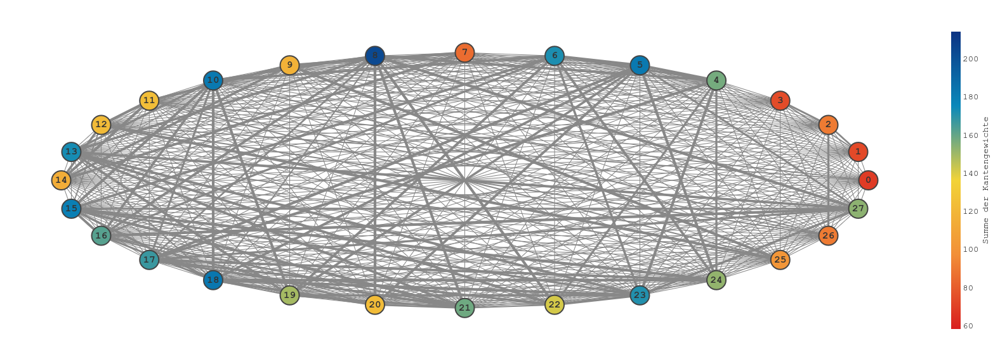

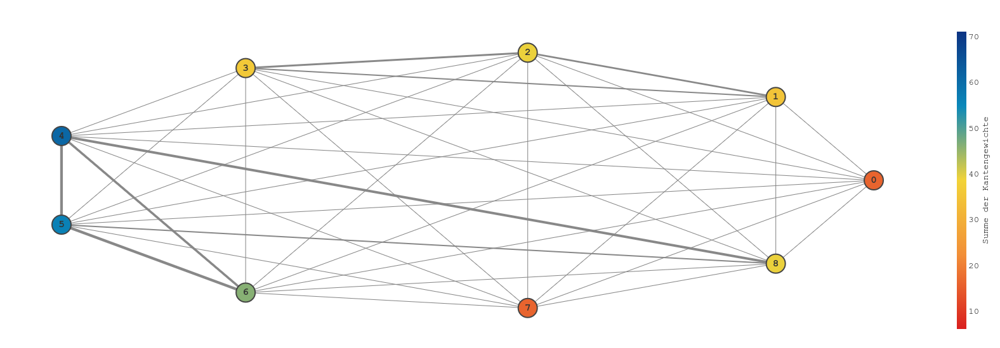

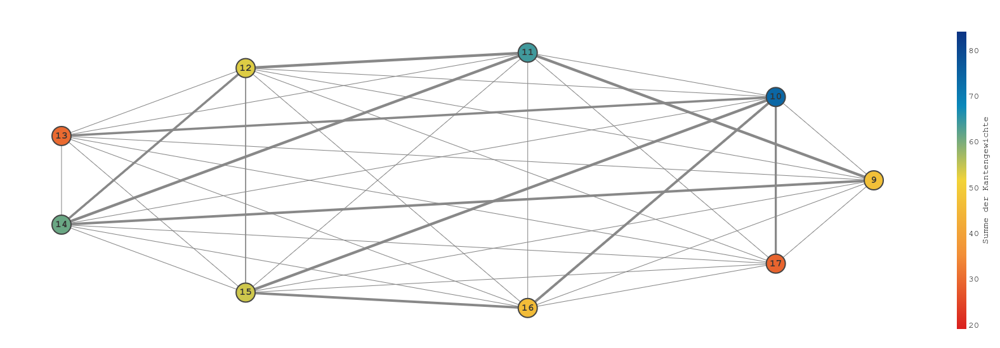

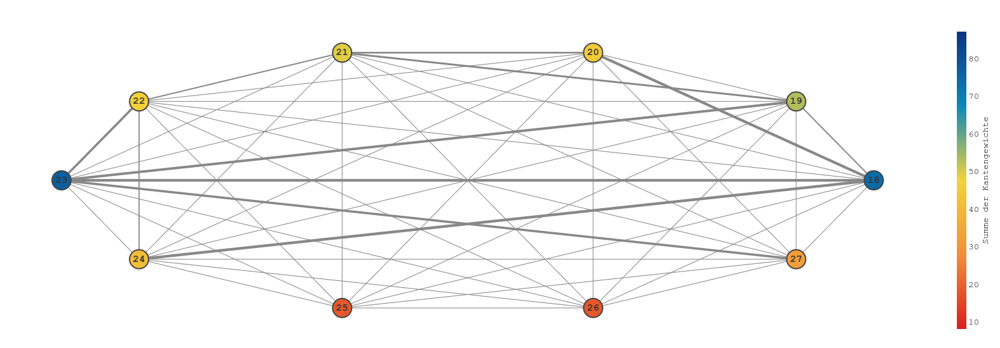

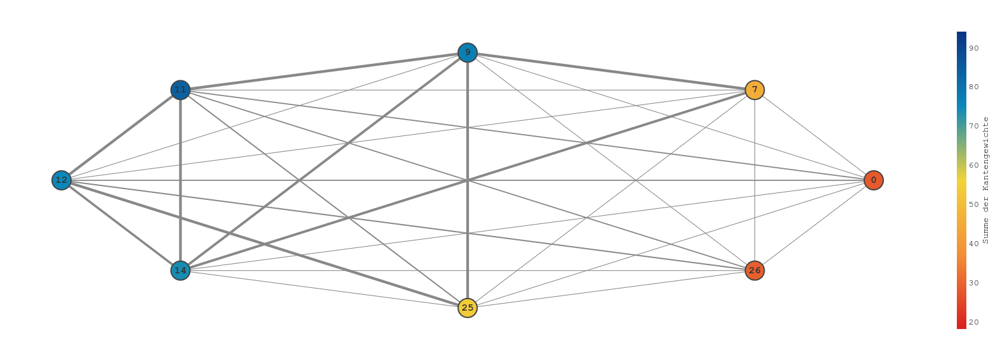

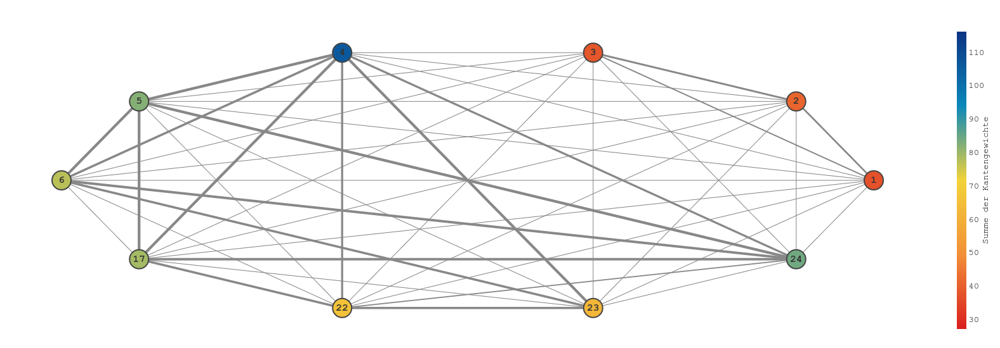

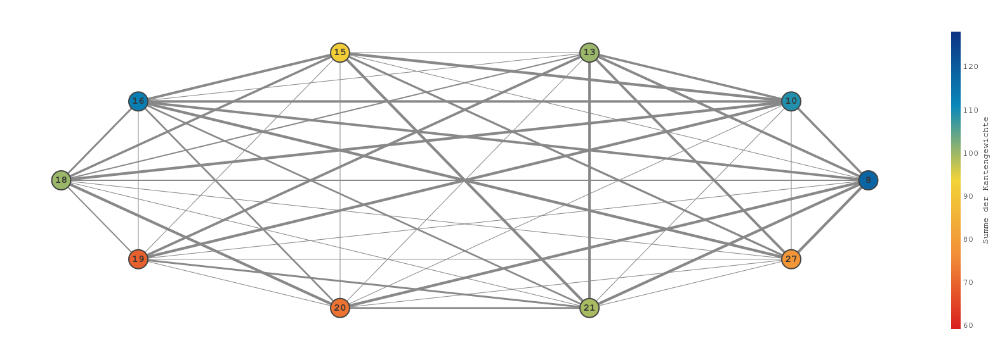

In [19]:
for graph in all_graphs:
    #print(graph[1])
    plotly_graph(graph[0], graph[1])

# Compare average weights before and after Metis split

In [20]:
def get_average_edge_weight_from_graph(G):
    if G.number_of_edges() > 0:
        return G.size(weight='weight')/G.number_of_edges()
    else:
        return 0

In [21]:
weight_list = []
weight_list_with_title = []
for graph in all_graphs:
    result = get_average_edge_weight_from_graph(graph[0])
    weight_list.append(result)
    weight_list_with_title.append((graph[1], result))
    print(f"{graph[1]:20} weight = {result:3.3f}")

Whole Graph          weight = 5.114
Group 1 actual       weight = 4.778
Group 2 actual       weight = 6.361
Group 3 actual       weight = 5.044
Group 1 suggested    weight = 8.321
Group 2 suggested    weight = 7.467
Group 3 suggested    weight = 10.556


In [22]:
split_weight_actual = sum(i for i in weight_list[1:4])

In [23]:
print(f"{split_weight_actual:.4f}")

16.1833


In [24]:
split_weight_suggested = sum(i for i in weight_list[4:])

In [25]:
print(f"{split_weight_suggested:.4f}")

26.3437


In [26]:
split_weight_increase_absolute = split_weight_suggested - split_weight_actual

In [27]:
print(f"{split_weight_increase_absolute:.4f}")

10.1603


In [28]:
split_weight_increase_percentage = (split_weight_increase_absolute/split_weight_actual)*100

In [29]:
print(f"{split_weight_increase_percentage:.4f}%")

62.7826%


In [30]:
weight_list_with_title

[('Whole Graph', 5.113756613756614),
 ('Group 1 actual', 4.777777777777778),
 ('Group 2 actual', 6.361111111111111),
 ('Group 3 actual', 5.044444444444444),
 ('Group 1 suggested', 8.321428571428571),
 ('Group 2 suggested', 7.466666666666667),
 ('Group 3 suggested', 10.555555555555555)]

# Compare actual and suggested groups

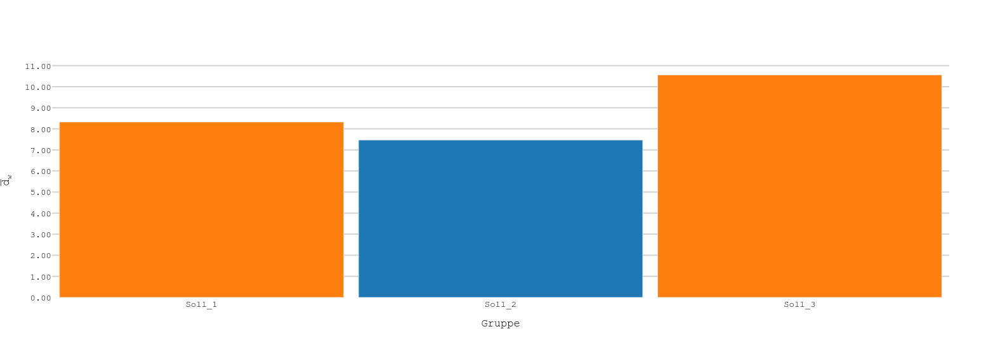

In [31]:
types=['actual', 'suggested']
colors = ["rgb(255, 127, 14)", "rgb(31, 119, 180)"]*20
x=["Soll_1","Soll_2","Soll_3"]
y = [graph[1] for graph in weight_list_with_title[4:]]
fig = go.Figure([go.Bar(x=x, y=y, marker_color=colors)])
fig.update_layout(autosize=False,
                width=650,
                height=550,
                bargap=0.05,
                paper_bgcolor='rgba(0,0,0,0)',
                plot_bgcolor='rgba(0,0,0,0)',
                font_family="Courier New",
                font=dict(
                    family="Courier New",
                    size=14,
                    color="Black"
                ),
                xaxis_title="Gruppe",
                yaxis_title="<SPAN STYLE='text-decoration:overline'>d</SPAN><sub>w</sub>",
)
fig.update_yaxes(showgrid=True, gridwidth=2, gridcolor='LightGrey', dtick = 1, tickformat=".2f")
fig.update_xaxes(showgrid=False, gridwidth=2, gridcolor='LightGrey', dtick = 1, tickformat=".0f")
fig.write_image(f"q_soll.svg", format="svg")
fig.show()

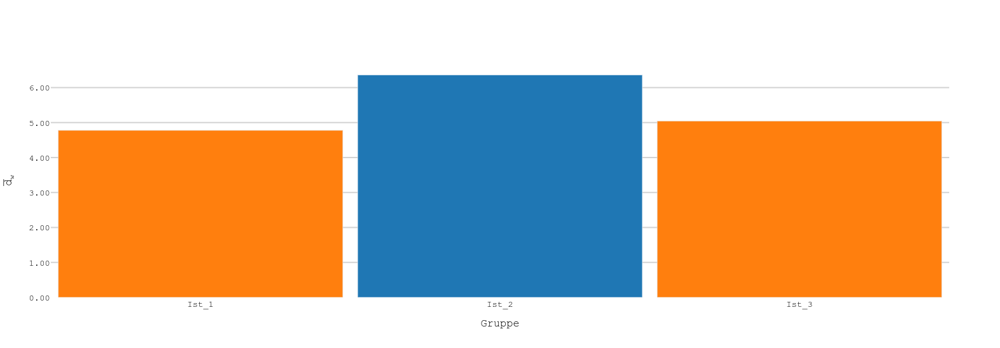

In [32]:
types=['actual', 'suggested']
colors = ["rgb(255, 127, 14)", "rgb(31, 119, 180)"]*20
x=["Ist_1","Ist_2","Ist_3"]
y = [graph[1] for graph in weight_list_with_title[1:4]]
fig = go.Figure([go.Bar(x=x, y=y, marker_color=colors)])
fig.update_layout(autosize=False,
                width=650,
                height=550,
                bargap=0.05,
                paper_bgcolor='rgba(0,0,0,0)',
                plot_bgcolor='rgba(0,0,0,0)',
                font_family="Courier New",
                font=dict(
                    family="Courier New",
                    size=14,
                    color="Black"
                ),
                xaxis_title="Gruppe",
                yaxis_title="<SPAN STYLE='text-decoration:overline'>d</SPAN><sub>w</sub>",
)
fig.update_yaxes(showgrid=True, gridwidth=2, gridcolor='LightGrey', dtick = 1, tickformat=".2f")
fig.update_xaxes(showgrid=False, gridwidth=2, gridcolor='LightGrey', dtick = 1, tickformat=".0f")
fig.write_image(f"q_soll.svg", format="svg")
fig.show()

# Compare actual and suggested split with random split

In [33]:
def Diff(li1, li2):
    li_dif = [i for i in li1 + li2 if i not in li1 or i not in li2]
    return li_dif

In [34]:
def create_random_split(list_in, n):
    l = list_in.copy()
    random.shuffle(l)
    return [l[i::n] for i in range(n)]

In [35]:
random_split_weight = []
for k in range(100000):
    split_graph_weight = 0
    #random_split = create_random_split(G,3)
    random_split = create_random_split(list(G.nodes), 3)
    for graph in random_split:
        T = G.subgraph(graph)
        sub_graph_weight = get_average_edge_weight_from_graph(T) 
        split_graph_weight += T.size(weight='weight')/T.number_of_edges()
    random_split_weight.append(split_graph_weight)


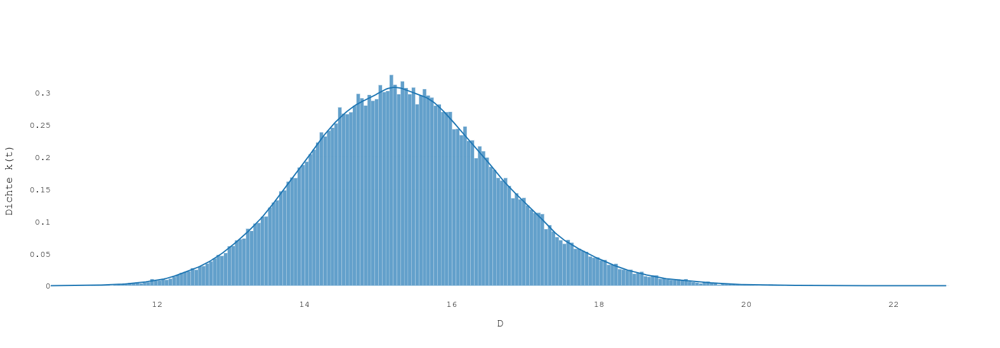

In [36]:
hist_data = [random_split_weight]
group_labels = ['distplot'] # name of the dataset

fig = ff.create_distplot(hist_data, group_labels, bin_size=.05, show_rug=False)
fig.update_layout(autosize=False,
                showlegend=False,
                width=650,
                height=550,
                bargap=0.05,
                paper_bgcolor='rgba(0,0,0,0)',
                plot_bgcolor='rgba(0,0,0,0)',
                font_family="Courier New",
                font=dict(
                    family="Courier New",
                    size=14,
                    color="Black"
                ),
                xaxis_title="D",
                yaxis_title="Dichte k(t)",)
fig.write_image(f"gaussian_kde.svg", format="svg")
fig.show()

In [37]:
density = gaussian_kde(random_split_weight)
xs = np.linspace(min(random_split_weight),max(random_split_weight),10000)
ys = density(xs)
index = np.argmax(ys)
max_y = ys[index]
max_x = xs[index]

In [38]:
print(max_x)

15.224675800913424


In [39]:
print(max(random_split_weight))

22.738888888888887


In [40]:
print(min(random_split_weight))

10.555555555555555


In [41]:
print(split_weight_increase_random_absolute = split_weight_suggested - max_x)

TypeError: 'split_weight_increase_random_absolute' is an invalid keyword argument for print()

In [ ]:
print(f"{split_weight_increase_random_absolute:.4f}")

In [ ]:
split_weight_increase_random_percentage = (split_weight_increase_random_absolute/split_weight_actual)*100

In [ ]:
print(f"{split_weight_increase_random_percentage:.4f}%")

In [ ]:
D_ist = split_weight_actual
D_r = max_x
D_b = max(random_split_weight)
D_metis = split_weight_suggested

# Compare gain from random to actual and suggested split

In [ ]:
types=['D<sub>ist</sub>', 'D<sub>r</sub>', 'D<sub>b</sub>', 'D<sub>metis</sub>']
colors = ["rgb(255, 127, 14)", "rgb(31, 119, 180)"]*2
fig = go.Figure([go.Bar(x=types, y=[D_ist, D_r, D_b, D_metis], marker_color=colors)])
fig.update_layout(autosize=False,
                width=650,
                height=550,
                bargap=0.05,
                paper_bgcolor='rgba(0,0,0,0)',
                plot_bgcolor='rgba(0,0,0,0)',
                font_family="Courier New",
                font=dict(
                    family="Courier New",
                    size=14,
                    color="Black"
                ),
                xaxis_title="Split",
                yaxis_title="D",
)
fig.update_yaxes(showgrid=True, gridwidth=2, gridcolor='LightGrey', dtick = 2, tickformat=".0f")
fig.write_image(f"splits.svg", format="svg")
fig.show()




In [ ]:
types=['D<sub>r</sub>', 'D<sub>b</sub>', 'D<sub>metis</sub>']
colors = ["rgb(255, 127, 14)", "rgb(31, 119, 180)"]*2
fig = go.Figure([go.Bar(x=types, y=[((D_r-D_ist)/D_ist)*100, ((D_b-D_ist)/D_ist)*100, ((D_metis-D_ist)/D_ist)*100], marker_color=colors)])
fig.update_layout(autosize=False,
                width=650,
                height=550,
                bargap=0.05,
                paper_bgcolor='rgba(0,0,0,0)',
                plot_bgcolor='rgba(0,0,0,0)',
                font_family="Courier New",
                font=dict(
                    family="Courier New",
                    size=14,
                    color="Black"
                ),
                xaxis_title="Split",
                yaxis_title="D",
)
fig.update_yaxes(showgrid=True, gridwidth=2, gridcolor='LightGrey', dtick = 5, tickformat=".0f")
fig.write_image(f"splits_percentage.svg", format="svg")
fig.show()

In [ ]:
print(((D_r-D_ist)/D_ist)*100)

In [ ]:
print(((D_b-D_ist)/D_ist)*100)

In [ ]:
print(((D_metis-D_ist)/D_ist)*100)

In [ ]:
split_weight_increase_random_to_actual = ((split_weight_actual-max_x)/max_x)*100

In [ ]:
print(split_weight_increase_random_to_actual)

In [ ]:
split_weight_increase_random_to_suggested = ((split_weight_suggested-max_x)/max_x)*100

In [ ]:
print(split_weight_increase_random_to_suggested)

In [ ]:
types=['actual', 'suggested']
colors = ["rgb(255, 127, 14)", "rgb(31, 119, 180)"]
fig = go.Figure([go.Bar(x=types, y=[split_weight_increase_random_to_actual, split_weight_increase_random_to_suggested], marker_color=colors)])
fig.update_layout(autosize=False,
                width=1300,
                height=900,
                bargap=0.05,
                paper_bgcolor='rgba(0,0,0,0)',
                plot_bgcolor='rgba(0,0,0,0)',
                font=dict(
                    family="Arial, monospace",
                    size=18,
                    color="Black"
                ),
                xaxis_title="Group",
                yaxis_title="Weighted graph degree increase in %",
)
fig.update_yaxes(showgrid=True, gridwidth=2, gridcolor='LightGrey', dtick = 5, tickformat=".2f", ticksuffix = "%")
fig.show()

# Analysis of single Nodes

In [ ]:
all_nodes_and_weights = list(G.degree( weight="weight"))
all_nodes_and_weights.sort(key=operator.itemgetter(1))
x = [node[0] for node in all_nodes_and_weights]
y = [node[1]/(G.number_of_nodes()-1) for node in all_nodes_and_weights]
colors = ["rgb(255, 127, 14)", "rgb(31, 119, 180)"]*20
fig = go.Figure([go.Bar(x=x, y=y, marker_color=colors)])
fig.update_layout(autosize=False,
                width=650,
                height=550,
                bargap=0.05,
                paper_bgcolor='rgba(0,0,0,0)',
                plot_bgcolor='rgba(0,0,0,0)',
                font_family="Courier New",
                font=dict(
                    family="Courier New",
                    size=14,
                    color="Black"
                ),
                xaxis_title="Knoten",
                yaxis_title="\u00D8 gewichteter Knotengrad pro Knoten",
)
fig.update_yaxes(showgrid=True, gridwidth=2, gridcolor='LightGrey', dtick = 1, tickformat=".2f")
fig.update_xaxes(type='category')
fig.write_image(f"avg_degree.svg", format="svg")
fig.show()

In [ ]:
all_nodes_and_degree = list(G.degree())
all_nodes_and_degree.sort(key=operator.itemgetter(0))
x = [node[0] for node in all_nodes_and_degree]
y = [node[1] for node in all_nodes_and_degree]
colors = ["rgb(255, 127, 14)", "rgb(31, 119, 180)"]*20
fig = go.Figure([go.Bar(x=x, y=y, marker_color=colors)])
fig.update_layout(autosize=False,
                width=1300,
                height=900,
                bargap=0.05,
                paper_bgcolor='rgba(0,0,0,0)',
                plot_bgcolor='rgba(0,0,0,0)',
                font=dict(
                    family="Arial, monospace",
                    size=18,
                    color="Black"
                ),
                xaxis_title="Node",
                yaxis_title="Node degree",
)
fig.update_yaxes(showgrid=True, gridwidth=2, gridcolor='LightGrey', dtick = 1, tickformat=".0f")
fig.update_xaxes(type='category')

fig.show()

# Gruppen nach Funktion

In [ ]:
# Funktionen:
# 0: BI Specialist
# 1: Business Analyst
# 2: Junior Expert
# 3: Developer
# 4: Apprentice
# 5: Architect
# 6: Lead

#Nicht für die Projektarbeit verwendet.

gruppen_nach_rollen = [0,1,6,2,1,3,3,0,3,0,3,0,0,1,0,1,3,3,1,3,4,3,1,1,1,0,5,3]
g_bi_specialist = G.subgraph([i for i, j in enumerate(gruppen_nach_rollen) if j==0])
g_business_analyst = G.subgraph([i for i, j in enumerate(gruppen_nach_rollen) if j==1])
g_junior_expert = G.subgraph([i for i, j in enumerate(gruppen_nach_rollen) if j==2])
g_developer = G.subgraph([i for i, j in enumerate(gruppen_nach_rollen) if j==3])
g_apprentice = G.subgraph([i for i, j in enumerate(gruppen_nach_rollen) if j==4])
g_architect = G.subgraph([i for i, j in enumerate(gruppen_nach_rollen) if j==5])
g_lead = G.subgraph([i for i, j in enumerate(gruppen_nach_rollen) if j==6])
all_group_graphs=[(g_bi_specialist, "BI Specialist"), (g_business_analyst, "Business Analyist"), (g_junior_expert, "Junior Expert"), (g_developer, "Developer"), (g_apprentice, "Apprentice"), (g_architect, "Architect"), (g_lead, "Lead")]

In [ ]:
weight_list = []
weight_list_with_title = []
for graph in all_group_graphs:
    result = get_average_edge_weight_from_graph(graph[0])
    weight_list.append(result)
    weight_list_with_title.append((graph[1], result))
    print(f"{graph[1]:20} weight = {result:3.3f}")

# Die Gruppe

In [ ]:
labels = ['BI Specialist','Business Analyst','Junior Expert','Developer', "Apprentice", "Architect", "Lead"]
values = [7, 8, 1, 9,1,1,1]

fig = go.Figure(data=[go.Pie(labels=labels, values=values)])

fig.update_traces(textinfo='value+percent')
fig.update_layout(autosize=False,
                width=650,
                height=550,
                paper_bgcolor='rgba(0,0,0,0)',
                plot_bgcolor='rgba(0,0,0,0)',
                font_family="Courier New",
                font=dict(
                    family="Courier New",
                    size=18,
                    color="Black"
                )
)
fig.write_image(f"team.svg", format="svg")
fig.show()